In [315]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [316]:
df = pd.read_csv('./Houses.csv', encoding='latin-1', header=0)
df.head()

,Unnamed: 0,address,city,floor,id,latitude,longitude,price,rooms,sq,year
0,0,Podgórze Zab³ocie Stanis³awa Klimeckiego,Kraków,2.0,23918.0,50.049224,19.970379,749000.0,3.0,74.05,2021.0
1,1,Praga-Po³udnie Grochowska,Warszawa,3.0,17828.0,52.249775,21.106886,240548.0,1.0,24.38,2021.0
2,2,Krowodrza Czarnowiejska,Kraków,2.0,22784.0,50.066964,19.920025,427000.0,2.0,37.00,1970.0
3,3,Grunwald,Poznañ,2.0,4315.0,52.404212,16.882542,1290000.0,5.0,166.00,1935.0
4,4,Ochota Gotowy budynek. Stan deweloperski. Osta...,Warszawa,1.0,11770.0,52.212225,20.972630,996000.0,5.0,105.00,2020.0


In [317]:
# remove unneccesary column
df=df.drop('Unnamed: 0', axis=1)

In [318]:
df.tail()

,address,city,floor,id,latitude,longitude,price,rooms,sq,year
23759,Stare Miasto Naramowice,Poznañ,0.0,3976.0,52.449649,16.949408,543000.0,4.0,77.00,2020.0
23760,W³ochy,Warszawa,4.0,10206.0,52.186109,20.948438,910000.0,3.0,71.00,2017.0
23761,Nowe Miasto Malta ul. Katowicka,Poznañ,0.0,4952.0,52.397345,16.961939,430695.0,3.0,50.67,2022.0
23762,Podgórze Duchackie Walerego S³awka,Kraków,6.0,24148.0,50.024231,19.959569,359000.0,2.0,38.86,2021.0
23763,Ursynów,Warszawa,2.0,10889.0,52.141039,21.032321,604800.0,3.0,63.00,1978.0


In [319]:
df.shape

(23764, 10)

In [320]:
df['city'].value_counts()

city
Warszawa    9851
Kraków      9764
Poznañ      4149
Name: count, dtype: int64

In [321]:
# get rid of polish letters
df['city'] = df['city'].replace(['Poznañ','Kraków'], ['Poznan','Krakow'])

In [322]:
df.tail()

,address,city,floor,id,latitude,longitude,price,rooms,sq,year
23759,Stare Miasto Naramowice,Poznan,0.0,3976.0,52.449649,16.949408,543000.0,4.0,77.00,2020.0
23760,W³ochy,Warszawa,4.0,10206.0,52.186109,20.948438,910000.0,3.0,71.00,2017.0
23761,Nowe Miasto Malta ul. Katowicka,Poznan,0.0,4952.0,52.397345,16.961939,430695.0,3.0,50.67,2022.0
23762,Podgórze Duchackie Walerego S³awka,Krakow,6.0,24148.0,50.024231,19.959569,359000.0,2.0,38.86,2021.0
23763,Ursynów,Warszawa,2.0,10889.0,52.141039,21.032321,604800.0,3.0,63.00,1978.0


In [323]:
# cast few columns to int
df['price'] = df['price'].astype(int)
df['id'] = df['id'].astype(int)
df['year'] = df['year'].astype(int)
df['rooms'] = df['rooms'].astype(int)
df['floor'] = df['floor'].astype(int)

In [324]:
df.tail()

,address,city,floor,id,latitude,longitude,price,rooms,sq,year
23759,Stare Miasto Naramowice,Poznan,0,3976,52.449649,16.949408,543000,4,77.00,2020
23760,W³ochy,Warszawa,4,10206,52.186109,20.948438,910000,3,71.00,2017
23761,Nowe Miasto Malta ul. Katowicka,Poznan,0,4952,52.397345,16.961939,430695,3,50.67,2022
23762,Podgórze Duchackie Walerego S³awka,Krakow,6,24148,50.024231,19.959569,359000,2,38.86,2021
23763,Ursynów,Warszawa,2,10889,52.141039,21.032321,604800,3,63.00,1978


In [325]:
# add some helpful features
df['price_per_sq_meter']=df['price']/df['sq']
df['price_per_sq_meter']=df['price_per_sq_meter'].astype(int)

df['sq_meter_per_room']=df['sq']/df['rooms']
df['sq_meter_per_room']=df['sq_meter_per_room'].astype(int)

In [326]:
df.tail()

,address,city,floor,id,latitude,longitude,price,rooms,sq,year,price_per_sq_meter,sq_meter_per_room
23759,Stare Miasto Naramowice,Poznan,0,3976,52.449649,16.949408,543000,4,77.00,2020,7051,19
23760,W³ochy,Warszawa,4,10206,52.186109,20.948438,910000,3,71.00,2017,12816,23
23761,Nowe Miasto Malta ul. Katowicka,Poznan,0,4952,52.397345,16.961939,430695,3,50.67,2022,8500,16
23762,Podgórze Duchackie Walerego S³awka,Krakow,6,24148,50.024231,19.959569,359000,2,38.86,2021,9238,19
23763,Ursynów,Warszawa,2,10889,52.141039,21.032321,604800,3,63.00,1978,9600,21


In [327]:
import plotly.express as px

fig = px.scatter_mapbox(df, lat='latitude', lon='longitude',
                        hover_name='id', hover_data=['price', 'sq'], zoom=3, color="city")
fig.update_layout(mapbox_style='open-street-map',
                    margin={'r': 20, 't': 20, 'l': 20, 'b': 20})
fig.show()

In [328]:
px.scatter(df.query("city == 'Warszawa'"), x='sq', y='price_per_sq_meter', 
           size='sq', color='price', log_x=True, hover_name='id', size_max=50)

In [329]:
px.scatter(df.query("city == 'Krakow'"), x='sq', y='price_per_sq_meter', 
           size='sq', color='price', log_x=True, hover_name='id', size_max=50)

In [330]:
px.scatter(df.query("city == 'Poznan'"), x='sq', y='price_per_sq_meter', 
           size='sq', color='price', log_x=True, hover_name='id', size_max=50)

In [331]:
fig = px.violin(df, x= 'city', y='price_per_sq_meter', box=True, points="all" )
fig.show()

In [332]:
# Oczyscmy troche dane z wartosci odstajacych
q_low = df['sq'].quantile(0.001)
q_high  = df['sq'].quantile(0.999)
df = df[(df['sq'] < q_high) & (df['sq'] > q_low)]

In [333]:
q_low = df['year'].quantile(0.001)
q_hi  = df['year'].quantile(0.999)
df = df[(df['year'] < q_hi) & (df['year'] > q_low)]

In [334]:
q_low = df['price_per_sq_meter'].quantile(0.001)
q_high  = df['price_per_sq_meter'].quantile(0.999)
df = df[(df['price_per_sq_meter'] < q_high) & (df['price_per_sq_meter'] > q_low)]

In [335]:
df=df[df['longitude'] >= 16.4]
df=df[df['longitude'] <= 21.3]
df=df[df['latitude'] <= 52.5]
df=df[df['latitude'] >= 50]

In [336]:
fig = px.violin(df, x= 'city', y='price_per_sq_meter', box=True, points="all", hover_name='id' )
fig.show()

In [337]:
fig = px.scatter(df, x="sq", y="price", color='city', hover_name='id')
fig.show()

In [338]:
fig = px.density_mapbox(df, lat='latitude', lon='longitude', z= 'price_per_sq_meter' , radius=2,
                        hover_name='id', hover_data=['price', 'sq'], zoom=5)
fig.update_layout(mapbox_style='carto-positron',
                    margin={'r': 10, 't': 10, 'l': 10, 'b': 10})
fig.show()

<Axes: >

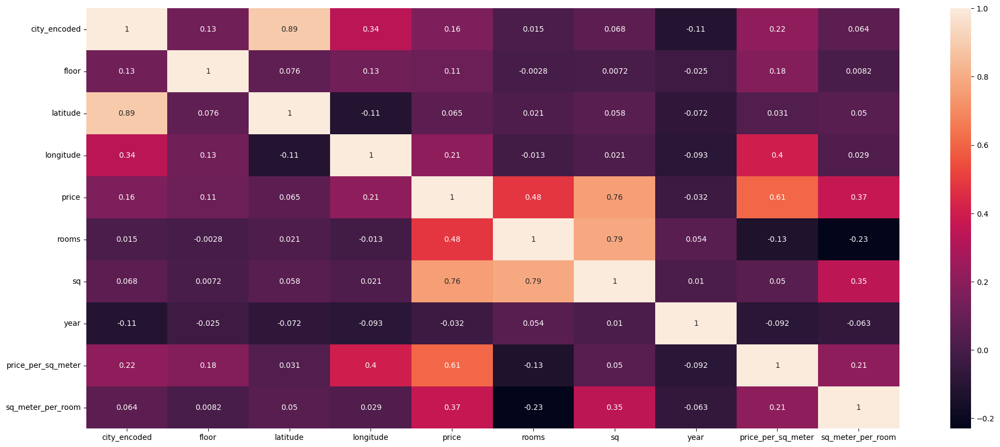

In [339]:
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
df['city_encoded'] = label_encoder.fit_transform(df['city'])
correlation_matrix = df[['city_encoded', 'floor', 'latitude', 'longitude', 'price', 'rooms', 'sq', 'year', 'price_per_sq_meter', 'sq_meter_per_room']].corr()

plt.figure(figsize = (24,10))
sns.heatmap(correlation_matrix, annot = True,cmap = 'rocket')

In [340]:
df = df.drop(['city_encoded', 'address', 'price_per_sq_meter', 'sq_meter_per_room', 'id'], axis=1)

In [341]:
df.tail()

,city,floor,latitude,longitude,price,rooms,sq,year
23759,Poznan,0,52.449649,16.949408,543000,4,77.00,2020
23760,Warszawa,4,52.186109,20.948438,910000,3,71.00,2017
23761,Poznan,0,52.397345,16.961939,430695,3,50.67,2022
23762,Krakow,6,50.024231,19.959569,359000,2,38.86,2021
23763,Warszawa,2,52.141039,21.032321,604800,3,63.00,1978


In [342]:
# Random Forest Regression ~ 60s

import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.pipeline import Pipeline

# separate X and y
X = df.drop(['price'], axis=1)
y = df['price']

# Perform one-hot encoding for categorical variables
X_encoded = pd.get_dummies(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, shuffle=True, test_size=0.2, random_state=42)

# Create a pipeline with StandardScaler and Random Forest Regressor
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('rf', RandomForestRegressor())
])

# Define the hyperparameter distribution for randomized search
param_grid = {
    'rf__n_estimators': [100, 200, 300],
    'rf__max_depth': [None, 5, 10],
    'rf__min_samples_split': [2, 5, 10]
}

# Perform randomized search with cross-validation
random_search = GridSearchCV(pipeline, param_grid, cv=5, n_jobs=-1)
random_search.fit(X_train, y_train)

# Get the best model and its parameters
best_model_rf = random_search.best_estimator_
best_params_rf = random_search.best_params_

# Make predictions on the test set using the best model
y_pred_rf = best_model_rf.predict(X_test)

mse_rf = mean_squared_error(y_test, y_pred_rf)

print('Mean Absolute Error:', mean_absolute_error(y_test, y_pred_rf))
print('Mean Squared Error:', mean_squared_error(y_test, y_pred_rf))
print('Root Mean Squared Error:', np.sqrt(mse_rf))
print("R2 Score:", r2_score(y_test, y_pred_rf))
print("Best Parameters:", best_params_rf)

Mean Absolute Error: 64166.34679098161
Mean Squared Error: 31226262720.021206
Root Mean Squared Error: 176709.54337562306
R2 Score: 0.8488012698250151
Best Parameters: {'rf__max_depth': None, 'rf__min_samples_split': 2, 'rf__n_estimators': 200}


In [343]:
# XGBoost ~ 62s

import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from xgboost import XGBRegressor
from sklearn.preprocessing import StandardScaler

# Separate features (X) and target variable (y)
X = df.drop(['price'], axis=1)
y = df['price']

# Perform one-hot encoding for categorical variables
X_encoded = pd.get_dummies(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, shuffle=True, test_size=0.2, random_state=42)

# Create a pipeline with StandardScaler and XGBoost
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('xgb', XGBRegressor())
])

# Define the hyperparameter grid for grid search
param_grid = {
    'xgb__n_estimators': [100, 200, 300, 400],  # Number of trees
    'xgb__max_depth': [3, 4, 5, 6, 7, 8],  # Maximum depth of each tree
    'xgb__learning_rate': [0.1, 0.01, 0.001]  # Learning rate
}

# Perform randomized search with cross-validation
random_search = GridSearchCV(pipeline, param_grid, cv=5, n_jobs=-1)
random_search.fit(X_train, y_train)

# Get the best model and its parameters
best_model_xg = random_search.best_estimator_
best_params_xg = random_search.best_params_

# Make predictions on the test set using the best model
y_pred_xg = best_model_xg.predict(X_test)

mse_xg = mean_squared_error(y_test, y_pred_xg)

# Evaluate the model's performance
print('Mean Absolute Error:', mean_absolute_error(y_test, y_pred_xg))
print('Mean Squared Error:', mean_squared_error(y_test, y_pred_xg))
print('Root Mean Squared Error:', np.sqrt(mse_xg))
print("R2 Score:", r2_score(y_test, y_pred_xg))
print("Best Parameters:", best_params_xg)


Mean Absolute Error: 66308.78720206142
Mean Squared Error: 27418512275.25087
Root Mean Squared Error: 165585.36250300286
R2 Score: 0.8672385396717001
Best Parameters: {'xgb__learning_rate': 0.1, 'xgb__max_depth': 7, 'xgb__n_estimators': 400}


In [344]:
# SVM ~ 40s

import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

# Separate features (X) and target variable (y)
X = df.drop(['price'], axis=1)
y = df['price']

# Perform one-hot encoding for categorical variables
X_encoded = pd.get_dummies(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, shuffle=True, test_size=0.2, random_state=42)

# Create a pipeline with StandardScaler and SVR
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('svm', SVR())
])

# Define the hyperparameter grid for grid search
param_grid = {
    'svm__C': [10, 100, 1000],
    'svm__epsilon': [0.1, 1, 10],
    'svm__kernel': ['linear', 'rbf']
}

# Perform randomized search with cross-validation
random_search = GridSearchCV(pipeline, param_grid, cv=5, n_jobs=-1)
random_search.fit(X_train, y_train)

# Get the best model and its parameters
best_model_svm = random_search.best_estimator_
best_params_svm = random_search.best_params_

# Make predictions on the test set using the best model
y_pred_svm = best_model_svm.predict(X_test)

mse_svm = mean_squared_error(y_test, y_pred_svm)

# Evaluate the model's performance
print('Mean Absolute Error:', mean_absolute_error(y_test, y_pred_svm))
print('Mean Squared Error:', mean_squared_error(y_test, y_pred_svm))
print('Root Mean Squared Error:', np.sqrt(mse_svm))
print("R2 Score:", r2_score(y_test, y_pred_svm))
print("Best Parameters:", best_params_svm)

Mean Absolute Error: 135445.8574377104
Mean Squared Error: 86392087259.09694
Root Mean Squared Error: 293925.30898018455
R2 Score: 0.5816862873453374
Best Parameters: {'svm__C': 1000, 'svm__epsilon': 10, 'svm__kernel': 'linear'}


In [345]:
# Separate features (X) and target variable (y)
X = df.drop(['price'], axis=1)
y = df['price']

# Perform one-hot encoding for categorical variables
X_encoded = pd.get_dummies(X)
print(X_encoded.info())

<class 'pandas.core.frame.DataFrame'>
Index: 23285 entries, 0 to 23763
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   floor          23285 non-null  int64  
 1   latitude       23285 non-null  float64
 2   longitude      23285 non-null  float64
 3   rooms          23285 non-null  int64  
 4   sq             23285 non-null  float64
 5   year           23285 non-null  int64  
 6   city_Krakow    23285 non-null  bool   
 7   city_Poznan    23285 non-null  bool   
 8   city_Warszawa  23285 non-null  bool   
dtypes: bool(3), float64(3), int64(3)
memory usage: 1.3 MB
None


In [346]:
# Neuronal Netowork

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
from keras.callbacks import History
from sklearn.metrics import r2_score
from keras.callbacks import EarlyStopping

# Separate features (X) and target variable (y)
X = df.drop(['price'], axis=1)
y = df['price']

# Perform one-hot encoding for categorical variables
X_encoded = pd.get_dummies(X)

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, shuffle=True, test_size=0.2, random_state=42)

# Normalize the data
scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Build the neural network model with Dropout and BatchNormalization
model = tf.keras.models.Sequential([
    tf.keras.layers.Dense(32, activation='relu', input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),  # Add Dropout

    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dropout(0.2),  # Add Dropout

    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dropout(0.2),  # Add Dropout

    tf.keras.layers.Dense(16, activation='relu'),
    tf.keras.layers.Dropout(0.2),  # Add Dropout

    tf.keras.layers.Dense(1, activation='linear')
])


# Compile the model
model.compile(optimizer='adam', loss='mse', metrics=['mae'])

# Create a History object to collect the training history
history = History()

# Define callbacks for early stopping and learning rate reduction
early_stopping = EarlyStopping(patience=10, restore_best_weights=True)

# Train the model and collect the training history
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test), callbacks=[history, early_stopping])



Epoch 1/100
583/583 [==============================] - 1s 844us/step - loss: 423605764096.0000 - mae: 452509.9375 - val_loss: 181991489536.0000 - val_mae: 230512.6250
Epoch 2/100
583/583 [==============================] - 0s 715us/step - loss: 203086282752.0000 - mae: 257428.5625 - val_loss: 172258525184.0000 - val_mae: 224329.7812
Epoch 3/100
583/583 [==============================] - 0s 728us/step - loss: 194340110336.0000 - mae: 249584.7969 - val_loss: 162888351744.0000 - val_mae: 215006.3594
Epoch 4/100
583/583 [==============================] - 0s 720us/step - loss: 183655006208.0000 - mae: 241939.9531 - val_loss: 151370956800.0000 - val_mae: 201963.7969
Epoch 5/100
583/583 [==============================] - 0s 709us/step - loss: 170124361728.0000 - mae: 229039.5781 - val_loss: 135897513984.0000 - val_mae: 189479.2812
Epoch 6/100
583/583 [==============================] - 0s 711us/step - loss: 152345198592.0000 - mae: 217078.9844 - val_loss: 117351325696.0000 - val_mae: 171484.312

146/146 [==============================] - 0s 310us/step
R2 Score: 0.6891050652887294
Mean Squared Error: 64207463239.82113
Mean Absolute Error: 129609.49808084604


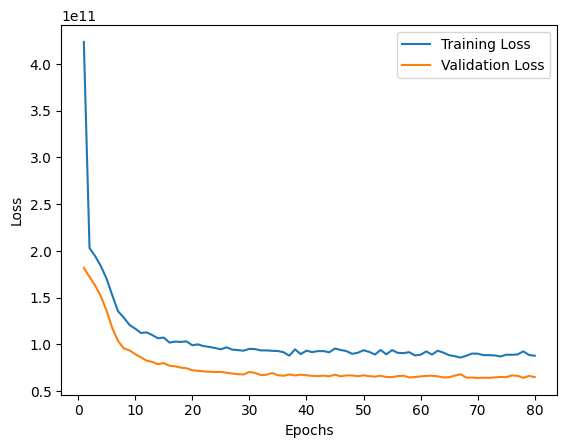

In [347]:
# Evaluate the model
y_pred_nn = model.predict(X_test)
mse_nn = mean_squared_error(y_test, y_pred_nn)
mae_nn = mean_absolute_error(y_test, y_pred_nn)

print("R2 Score:", r2_score(y_test, y_pred_nn))
print('Mean Squared Error:', mse_nn)
print('Mean Absolute Error:', mae_nn)

# Visualize the regression metrics over epochs
epochs = range(1, len(history.history['loss']) + 1)
plt.plot(epochs, history.history['loss'], label='Training Loss')
plt.plot(epochs, history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

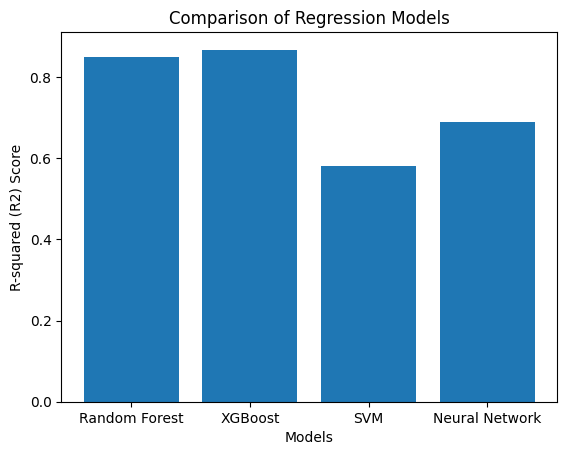

In [348]:
# R2 scores comparision
rf_r2_score = r2_score(y_test, y_pred_rf)
xg_r2_score = r2_score(y_test, y_pred_xg)
svm_r2_score = r2_score(y_test, y_pred_svm)
nn_r2_score = r2_score(y_test, y_pred_nn)

models = ['Random Forest', 'XGBoost', 'SVM', 'Neural Network']

models = ['Random Forest', 'XGBoost', 'SVM', 'Neural Network']

# Create a bar chart comparing the R2 scores
r2_scores = [rf_r2_score, xg_r2_score, svm_r2_score, nn_r2_score]

plt.bar(models, r2_scores)
plt.xlabel('Models')
plt.ylabel('R-squared (R2) Score')
plt.title('Comparison of Regression Models')

plt.show()


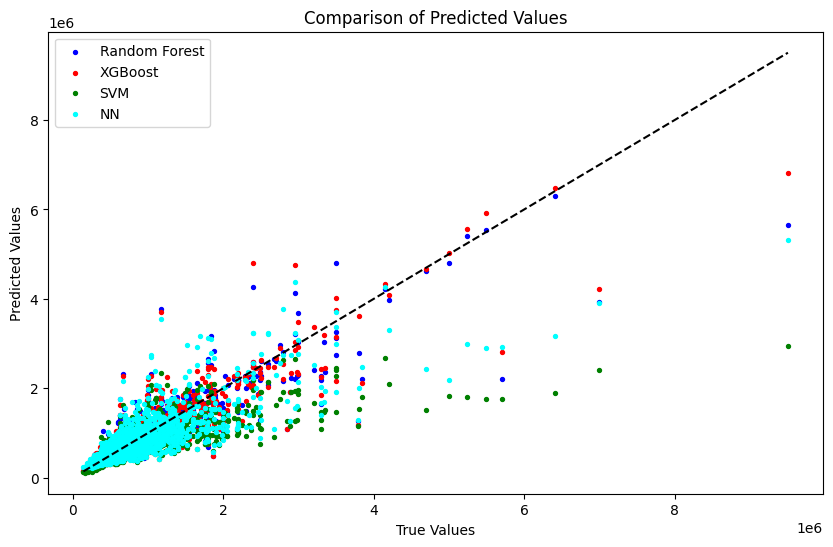

In [349]:
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_rf, color='blue', label='Random Forest', s=8)
plt.scatter(y_test, y_pred_xg, color='red', label='XGBoost', s=8)
plt.scatter(y_test, y_pred_svm, color='green', label='SVM', s=8)
plt.scatter(y_test, y_pred_nn, color='cyan', label='NN', s=8)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='black', linestyle='--')
plt.xlabel('True Values')
plt.ylabel('Predicted Values')
plt.title('Comparison of Predicted Values')
plt.legend()
plt.show()

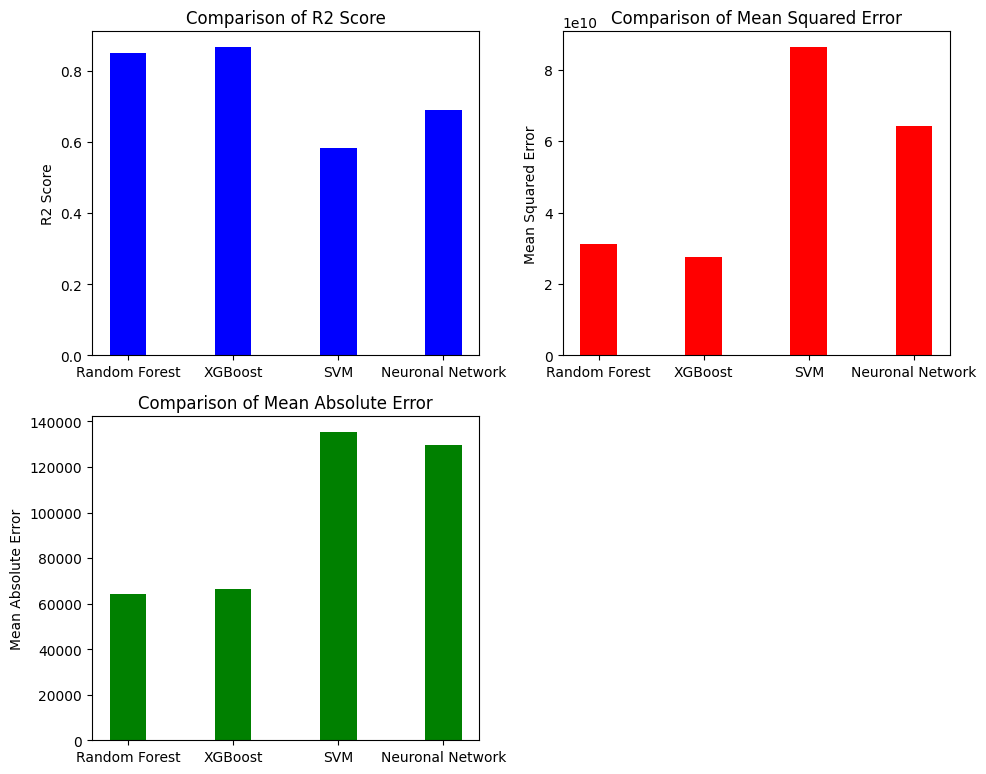

In [350]:
import numpy as np
import matplotlib.pyplot as plt

# Set the models and their scores
models = ['Random Forest', 'XGBoost', 'SVM', "Neuronal Network"]
r2_scores = [rf_r2_score, xg_r2_score, svm_r2_score, nn_r2_score]
mse_scores = [mse_rf, mse_xg, mse_svm, mse_nn]
mae_scores = [mean_absolute_error(y_test, y_pred_rf), mean_absolute_error(y_test, y_pred_xg), mean_absolute_error(y_test, y_pred_svm), mae_nn]

# Set the width of the bars
bar_width = 0.35

# Set the positions of the bars on the x-axis
bar_pos = np.arange(len(models))

# Create subplots for each metric
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 8))

# Bar chart for R2 Score
axes[0, 0].bar(bar_pos, r2_scores, color='blue', width=bar_width)
axes[0, 0].set_xticks(bar_pos)
axes[0, 0].set_xticklabels(models)
axes[0, 0].set_ylabel('R2 Score')
axes[0, 0].set_title('Comparison of R2 Score')

# Bar chart for Mean Squared Error
axes[0, 1].bar(bar_pos, mse_scores, color='red', width=bar_width)
axes[0, 1].set_xticks(bar_pos)
axes[0, 1].set_xticklabels(models)
axes[0, 1].set_ylabel('Mean Squared Error')
axes[0, 1].set_title('Comparison of Mean Squared Error')

# Bar chart for Mean Absolute Error
axes[1, 0].bar(bar_pos, mae_scores, color='green', width=bar_width)
axes[1, 0].set_xticks(bar_pos)
axes[1, 0].set_xticklabels(models)
axes[1, 0].set_ylabel('Mean Absolute Error')
axes[1, 0].set_title('Comparison of Mean Absolute Error')

# Remove empty subplot
fig.delaxes(axes[1, 1])

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()
